# Setup

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/

/content


In [ ]:
!git clone https://github.com/huggingface/transformers
# %cd transformers/examples/lxmert
# %pip install -r requirements.txt

Cloning into 'transformers'...
remote: Enumerating objects: 88, done.
remote: Counting objects: 100% (88/88), done.
remote: Compressing objects: 100% (83/83), done.
remote: Total 54630 (delta 49), reused 37 (delta 4), pack-reused 54542
Receiving objects: 100% (54630/54630), 40.79 MiB | 27.90 MiB/s, done.
Resolving deltas: 100% (38191/38191), done.


In [ ]:
!pip install tokenizers==0.8.1RC2
# !pip install tokenizers==0.8

     |████████████████████████████████| 3.0MB 10.2MB/s 


In [ ]:
# !pip install -e ".[dev]"

from tokenizers.models import BPE

In [ ]:
%cd /content/transformers/examples/lxmert

/content/transformers/examples/lxmert


In [ ]:
# !pip install wget
!pip install transformers

     |████████████████████████████████| 1.4MB 8.4MB/s 
     |████████████████████████████████| 890kB 28.9MB/s 
     |████████████████████████████████| 2.9MB 19.2MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893257 sha256=fc604aeee592608e3c6efce25c8c5599fdb4e96de0a0e83c821c0eeece4dda58
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses
  Found existing installation: tokenizers 0.8.1rc2
    Uninstalling tokenizers-0.8.1rc2:
      Successfully uninstalled tokenizers-0.8.1rc2


In [ ]:
!pip install wget

  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=ba17b7d9797a42f38d9c44b807125091cf34c5101d5d467bf8a394ee88416d48
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


In [ ]:
from IPython.display import clear_output, Image, display
import PIL.Image
import io
import json
import torch
import numpy as np
from processing_image import Preprocess
from visualizing_image import SingleImageViz
from modeling_frcnn import GeneralizedRCNN
from utils import Config
import utils
from transformers import LxmertForQuestionAnswering, LxmertTokenizer
import wget
import pickle
import os


In [ ]:
# load models and model components
frcnn_cfg = Config.from_pretrained("unc-nlp/frcnn-vg-finetuned")

frcnn = GeneralizedRCNN.from_pretrained("unc-nlp/frcnn-vg-finetuned", config=frcnn_cfg)

image_preprocess = Preprocess(frcnn_cfg)

lxmert_tokenizer = LxmertTokenizer.from_pretrained("unc-nlp/lxmert-base-uncased")
lxmert_gqa = LxmertForQuestionAnswering.from_pretrained("unc-nlp/lxmert-gqa-uncased")
lxmert_vqa = LxmertForQuestionAnswering.from_pretrained("unc-nlp/lxmert-vqa-uncased")

%s not found in cache or force_download set to True, downloading to %s https://s3.amazonaws.com/models.huggingface.co/bert/unc-nlp/frcnn-vg-finetuned/config.yaml /root/.cache/torch/transformers/tmpfrzbxw9v



loading configuration file cache
%s not found in cache or force_download set to True, downloading to %s https://cdn.huggingface.co/unc-nlp/frcnn-vg-finetuned/pytorch_model.bin /root/.cache/torch/transformers/tmpxfc9nvsg



loading weights file https://cdn.huggingface.co/unc-nlp/frcnn-vg-finetuned/pytorch_model.bin from cache at /root/.cache/torch/transformers/57f6df6abe353be2773f2700159c65615babf39ab5b48114d2b49267672ae10f.77b59256a4cf8343ae0f923246a81489fc8d82f98d082edc2d2037c977c0d9d0


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:434: UserWarning: Setting attributes on ParameterList is not supported.
  warnings.warn("Setting attributes on ParameterList is not supported.")


All model checkpoint weights were used when initializing GeneralizedRCNN.

All the weights of GeneralizedRCNN were initialized from the model checkpoint at unc-nlp/frcnn-vg-finetuned.
If your task is similar to the task the model of the checkpoint was trained on, you can already use GeneralizedRCNN for predictions without further training.


In [ ]:
from transformers import LxmertTokenizer, LxmertModel

In [ ]:
model = LxmertModel.from_pretrained('unc-nlp/lxmert-base-uncased')

#Testing to check the vision head of the lxmert Model


In [ ]:
inputs = lxmert_tokenizer("Hello, my dog is cute", return_tensors="pt")
outputs = model(**inputs, visual_feats=features, visual_pos = normalized_boxes, output_hidden_states=True)
# last_hidden_states = outputs.last_hidden_state

In [ ]:
vision_hidden_states = outputs.vision_hidden_states

In [ ]:
outputs.vision_hidden_states[0]

tensor([[[ 0.0528, -0.7242, -0.3235,  ...,  0.2875,  1.1689, -1.2295],
         [-0.1660, -0.6018, -0.1539,  ...,  0.6141,  1.3765, -1.4336],
         [-0.8916,  0.0380,  0.3659,  ...,  0.4317, -0.3665, -0.0168],
         ...,
         [-1.7513, -0.0613,  0.9046,  ...,  0.0549,  0.7760, -0.0080],
         [-1.1404, -0.0414,  0.1427,  ...,  0.0573, -0.6451, -0.3591],
         [-1.8331,  0.8759,  0.3293,  ...,  0.2740,  0.4447, -0.1704]]],
       grad_fn=<NativeLayerNormBackward>)

In [ ]:
import copy
temp = outputs.vision_output[0]

In [ ]:
temp

tensor([[-0.4188,  0.0972, -0.0143,  ...,  1.3934,  0.1801,  0.5994],
        [-0.5379, -0.1147, -0.2280,  ...,  1.4530,  0.5135,  0.7752],
        [-0.4279, -0.3741, -0.1233,  ...,  0.9390,  0.2988,  0.8267],
        ...,
        [-0.4420, -0.1584,  0.1809,  ...,  0.6389,  0.1301,  0.3595],
        [-0.3534,  0.2429,  0.2233,  ...,  0.5280,  0.2097,  0.8882],
        [-0.3133, -0.1141,  0.0773,  ...,  0.7372,  0.2563,  0.6611]],
       grad_fn=<SelectBackward>)

# Data Processing

In [ ]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

In [ ]:
import json
senticap_file = "/content/drive/MyDrive/senticap_dataset/data/senticap_dataset.json"
scap = json.load(open(senticap_file, "r"))

In [ ]:
s_descriptions = dict()
desc = {}
img_id_set = set()
for img in scap['images']:
  if img['split'] == 'train':
    l = list()
    for sent in img['sentences']:
      l.append(sent['raw'])
    desc[img['filename'].split(".")[0]] = l
    img_id_set.add(img['filename'].split(".")[0])
s_descriptions = desc
s_train = img_id_set

In [ ]:
print(len(s_descriptions))
desc['COCO_val2014_000000389081']

1217


['a plate of delicious food including French fries.',
 'French fries are not a healthy food but it is an excellent food for teenagers.',
 'The plate has one of my favorite foods on it, French fries.',
 'It was disgusting food, not just bad food.',
 'A plate of disgusting food found at a diner.',
 'The meat on the burger looks like disgusting food.']

In [ ]:
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(s_descriptions)

In [ ]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
# vocabulary = to_vocabulary(descriptions)
vocabulary = to_vocabulary(s_descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 3342


In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

# save_descriptions(descriptions, 'descriptions.txt')
save_descriptions(s_descriptions, 's_descriptions.txt')

In [ ]:

# desc = {}
# # img_id_set = set()
# for img in scap['images']:
#   if img['split'] == 'train':
#     l = list()
#     for sent in img['sentences']:
#       l.append(sent['raw'])
#     desc[img['filename'].split(".")[0]] = l
#     # img_id_set.add(img['filename'].split(".")[0])
# s_train_descriptions = desc
# # s_train = img_id_set
# clean_descriptions(s_train_descriptions)

In [ ]:
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

s_train_descriptions = load_clean_descriptions('s_descriptions.txt', s_train)
print('Descriptions: s_train=%d' % len(s_train_descriptions))

Descriptions: s_train=1217


In [ ]:
s_images = '/content/drive/MyDrive/CS685/val2014/'
s_img = glob.glob(s_images + '*.jpg')

In [ ]:
s_train_img = []
for i in scap['images']:
  if i['split'] == 'train':
    s_train_img.append(s_images+i['filename'])
len(s_train_img)
print(s_train_img[0])

/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000389081.jpg


In [ ]:
s_test_img = []
for i in scap['images']:
  if i['split'] == 'test':
    s_test_img.append(s_images+i['filename'])
print(len(s_test_img))
print(s_test_img[0])

878
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000497106.jpg


In [ ]:
s_test_img[257]

'/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000559773.jpg'

In [ ]:
s_all_train_captions = []
for key, val in s_train_descriptions.items():
    for cap in val:
        s_all_train_captions.append(cap)
len(s_all_train_captions)

4419

In [ ]:
len(s_train_img)

1217

In [ ]:
# s_train_features = []
# for img in s_train_img:
#   images, sizes, scales_yx = image_preprocess(img)
#   output_dict = frcnn(
#       images, 
#       sizes, 
#       scales_yx=scales_yx, 
#       padding="max_detections",
#       max_detections=frcnn_cfg.max_detections,
#       return_tensors="pt"
#   )
#   normalized_boxes = output_dict.get("normalized_boxes")
#   features = output_dict.get("roi_features")
#   inputs = lxmert_tokenizer("What is in the image?", return_tensors="pt")
#   outputs = model(**inputs, visual_feats=features, visual_pos = normalized_boxes)
#   s_train_features.append(torch.flatten(outputs.vision_output[0]))

In [ ]:
with open("odtl_416-682.pkl", "rb") as f:
  odtl = pickle.load(f)

In [ ]:
with open("stfeatures_416-682.pkl", "rb") as f:
  stf = pickle.load(f)

In [ ]:
len(stf.keys())

266

In [ ]:
# outputs.vision_output[0].shape
normalized_boxes.shape

torch.Size([1, 36, 4])

In [ ]:
s_train_features[0]

tensor([-0.0310,  0.0588,  0.2637,  ...,  0.7627, -0.5617,  1.4620],
       grad_fn=<ViewBackward>)

In [ ]:
# with open("stf.pkl", "wb") as f:
#   pickle.dump(s_train_features, f)

In [ ]:
word_count_threshold = 5
word_counts = {}
nsents = 0
for sent in s_all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 3344 -> 980


In [ ]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [ ]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

981

In [ ]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
# max_length = max_length(train_descriptions)
max_length = max_length(s_train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 36


In [ ]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key]# +'.jpg'
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo.tolist())
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [array(X1), array(X2)], array(y)
                X1, X2, y = list(), list(), list()
                n=0

In [ ]:
# Load Glove vectors
glove_dir = '/content/drive/MyDrive/dataset/glove'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [ ]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

embedding_matrix.shape

(981, 200)

In [ ]:
print(vocab_size, max_length)

981 36


In [ ]:
# Load all img features
with open("/content/drive/MyDrive/ICDl/stfeatures_0-149.pkl", "rb") as f:
  stf = pickle.load(f)
with open("/content/drive/MyDrive/ICDl/stfeatures_149-415.pkl", "rb") as f:
  stf1 = pickle.load(f)
with open("/content/drive/MyDrive/ICDl/stfeatures_416-682.pkl", "rb") as f:
  stf2 = pickle.load(f)
with open("/content/drive/MyDrive/ICDl/stfeatures_682-948.pkl", "rb") as f:
  stf3 = pickle.load(f)

In [ ]:
with open("/content/drive/MyDrive/ICDl/stfeatures_948-1217.pkl", "rb") as f:
  stf4 = pickle.load(f)

In [ ]:
s_enc_train_features = load(open("/content/drive/MyDrive/dataset/Pickle/s_encoded_train_images.pkl", "rb"))
print('Photos: s_train=%d' % len(s_enc_train_features))

Photos: s_train=1217


In [ ]:
s_enc_train_features.values()

In [ ]:
s_train_descriptions

In [ ]:
#convert stf0 to a dictionary
stf0 = dict()
for i in range(149):
  stf0[s_train_img[i]] = stf[i]

In [ ]:
for s_t_feat in [stf0, stf1, stf2, stf3, stf4]:
  kl = list(s_t_feat.keys())
  for i in kl:
    s_t_feat[i.split("/")[-1].split(".")[0]] = s_t_feat.pop(i)
# kl[0].split("/")[-1]

In [ ]:
s_train_features = {**stf0, **stf1, **stf2, **stf3, **stf4}

In [ ]:
for i in s_train_features.values():
  i.tolist()

In [ ]:
for i in s_train_features.values():
  print(i)

# Model(Small) Definition

In [ ]:
inputs1 = Input(shape=(27648,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

In [ ]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 36)]         0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 27648)]      0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 36, 200)      196200      input_2[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 27648)        0           input_1[0][0]                    
_______________________________________________________________________________________

In [ ]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
epochs = 10
number_pics_per_batch = 3
steps = len(s_train_descriptions)//number_pics_per_batch

In [ ]:
# %mkdir /content/drive/MyDrive/ICDl/RNNLXMert/senticap/model_weights

In [ ]:
for i in range(epochs):
    generator = data_generator(s_train_descriptions, s_train_features, wordtoix, max_length, number_pics_per_batch)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('/content/drive/MyDrive/ICDl/RNNLXMert/senticap/model_weights/model_' + str(i) + '.h5')

 21/405 [>.............................] - ETA: 3:37 - loss: 4.5324

In [ ]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [ ]:
with open("/content/drive/MyDrive/ICDl/stfeatures_test_0-219.pkl", "rb") as f:
  stf_test_0 = pickle.load(f)

In [ ]:
# with open("/content/drive/MyDrive/dataset/Pickle/s_encoded_test_images.pkl", "rb") as encoded_pickle:
#     encoding_test = load(encoded_pickle)

In [ ]:
pic = list(encoding_test.keys())[z]
print(pic)
image = encoding_test[pic].reshape((1,2048))
print(image)
z=1
type(image)

COCO_val2014_000000497106.jpg
[[0.58039314 0.4036663  0.49484354 ... 0.897854   0.95003927 0.00115858]]


numpy.ndarray

In [ ]:
import keras

model = keras.models.load_model("/content/drive/MyDrive/ICDl/RNNLXMert/senticap/model_weights/model_9.h5")

/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000557819.jpg
[[-0.3370518088340759], [0.5062421560287476], [0.09544913470745087], [-0.018188470974564552], [0.34206920862197876], [0.015073943883180618], [0.06921442598104477], [-0.24902546405792236], [0.26274266839027405], [0.5955855250358582], [0.3393690288066864], [-0.5274767279624939], [0.16614827513694763], [0.00016890793631318957], [-0.13524046540260315], [0.00793425738811493], [0.04530239477753639], [0.6907004714012146], [0.6361201405525208], [-0.561641275882721], [0.2241923213005066], [0.04083714261651039], [-0.33588191866874695], [0.11790813505649567], [-0.33891651034355164], [0.16754686832427979], [-0.3671175241470337], [-1.1082243919372559], [-0.26475390791893005], [0.5707396268844604], [0.8507081866264343], [-0.10750771313905716], [-0.21904751658439636], [0.2597639560699463], [-0.31447139382362366], [0.0899873897433281], [0.20899802446365356], [-0.39897534251213074], [0.44783997535705566], [-0.49000900983810425], [0.6795

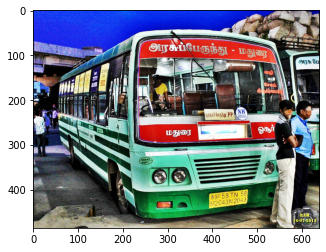

Greedy: lonely of walk bus lonely lonely on
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000450724.jpg
[[-0.2207781970500946], [0.03133790194988251], [-0.20388126373291016], [-0.26055917143821716], [0.3788667619228363], [-0.4864560663700104], [-0.3471466898918152], [-0.005488784052431583], [-0.15939106047153473], [0.21960799396038055], [0.8855957388877869], [0.03388221189379692], [0.47768181562423706], [0.19118207693099976], [-0.05297866091132164], [-0.6548126339912415], [0.09451010078191757], [0.34766462445259094], [0.2717379331588745], [-0.525926411151886], [0.4934444725513458], [-0.2781158685684204], [0.37671518325805664], [0.17835968732833862], [-0.15323077142238617], [-0.5405879616737366], [-0.2485790252685547], [-0.12380411475896835], [-0.08210986852645874], [-0.19211015105247498], [1.1722407341003418], [-0.6923391222953796], [-0.5236694812774658], [0.3601175546646118], [0.10171090066432953], [0.6915397047996521], [-0.17047971487045288], [0.0954652950167656], [0.340692698

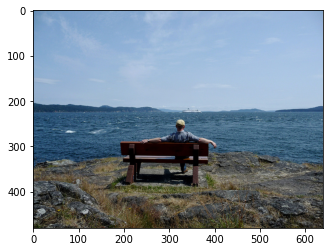

Greedy: the man on on on the the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000493805.jpg
[[-0.18693138659000397], [0.5121237635612488], [0.09625279903411865], [0.3941967189311981], [0.7385615110397339], [-0.10487022995948792], [0.271803081035614], [-0.19098612666130066], [0.008185646496713161], [0.16650229692459106], [0.19848287105560303], [-0.30913805961608887], [0.20631198585033417], [-0.14073961973190308], [0.3452918827533722], [-0.8401651382446289], [-0.475072979927063], [0.29623931646347046], [0.27504801750183105], [0.02798505499958992], [0.737372875213623], [0.2540160119533539], [0.33264949917793274], [0.10750310868024826], [-0.06406553089618683], [0.26817095279693604], [-0.1311788111925125], [-0.7277736067771912], [-0.01920795999467373], [-0.17970527708530426], [0.11249173432588577], [-0.5116146206855774], [-0.05340554565191269], [-0.2946763038635254], [0.8674702048301697], [0.6769652366638184], [-0.2730151116847992], [-0.6270055174827576], [0.15275736153125763], [0.3

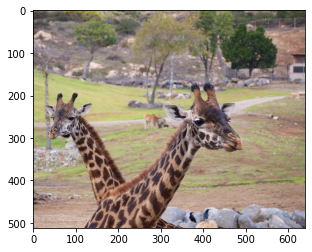

Greedy: two zebras stand in field grass dead
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000247639.jpg
[[-0.029112525284290314], [0.214766263961792], [0.3535490334033966], [-0.2160346508026123], [0.4706552028656006], [-0.937328040599823], [-0.18411974608898163], [-0.12739020586013794], [0.03322846069931984], [0.2846622169017792], [-0.16204313933849335], [-0.1057700365781784], [0.11630081385374069], [-0.4555778503417969], [-0.08161047846078873], [-0.6930233836174011], [-0.2616848945617676], [0.22469139099121094], [0.26155853271484375], [-0.4870661497116089], [0.7781907320022583], [-0.20932751893997192], [-0.12287677079439163], [0.7116740345954895], [-0.20107395946979523], [0.02507115714251995], [-0.2709423899650574], [-0.6225370168685913], [0.11312539130449295], [0.05031772702932358], [-0.02294069156050682], [-0.7909203767776489], [-0.3016757071018219], [-0.2102966606616974], [-0.3647918999195099], [0.8844035863876343], [-0.07650071382522583], [0.11438650637865067], [0.22864280

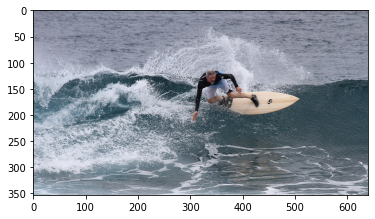

Greedy: dead man on on on on the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000273067.jpg
[[-0.6006424427032471], [0.11727167665958405], [0.08701147884130478], [0.030202794820070267], [0.12495966255664825], [0.11603409051895142], [0.1789456307888031], [0.07012587040662766], [0.3012467622756958], [0.7856830358505249], [0.2719564437866211], [-0.7547205090522766], [-0.07722272723913193], [0.11118599772453308], [-0.16787712275981903], [0.05769331753253937], [-0.28549250960350037], [0.455910325050354], [0.5914896726608276], [-0.8048660755157471], [0.15664593875408173], [0.07534006237983704], [0.25818759202957153], [0.37919363379478455], [-0.15647155046463013], [-0.08965384215116501], [0.29386818408966064], [-1.0529412031173706], [-0.019293636083602905], [0.12091761082410812], [0.8135766983032227], [-0.2751181721687317], [-0.2316703349351883], [0.4117123782634735], [-0.3739437162876129], [0.2941950857639313], [0.4929969906806946], [-0.3758821189403534], [0.15378469228744507], [0.18

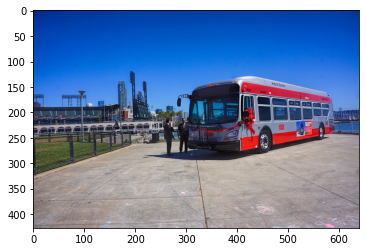

Greedy: lonely train train stopped the the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000077954.jpg
[[0.19956624507904053], [0.42234256863594055], [-0.2418595254421234], [-0.0051757898181676865], [-0.06266612559556961], [-0.9402401447296143], [-0.2860042452812195], [-0.27076104283332825], [0.34560006856918335], [-0.1732543408870697], [0.33401793241500854], [-0.359636515378952], [0.33995500206947327], [-0.2414150834083557], [0.11014419794082642], [-0.4974566698074341], [-0.9456882476806641], [0.05196700617671013], [-0.13528694212436676], [0.1653498411178589], [0.7097870707511902], [-0.16026943922042847], [-0.1777069866657257], [0.7017884254455566], [-0.2336297482252121], [0.20744527876377106], [-0.19045892357826233], [-1.0098758935928345], [0.3761975169181824], [0.2542792558670044], [-0.07388968020677567], [-0.21825940907001495], [-0.6260660886764526], [0.9444007873535156], [0.15013757348060608], [1.0628743171691895], [0.5190059542655945], [-0.47975775599479675], [-0.048121325

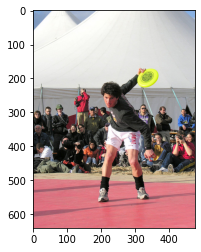

Greedy: dead of of people tennis court serve serve
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000531499.jpg
[[-0.7574814558029175], [0.3886556327342987], [-0.05779813602566719], [0.12877069413661957], [0.804790198802948], [-0.4655594229698181], [0.17806755006313324], [-0.1749776154756546], [0.34791114926338196], [-0.20680099725723267], [0.06784788519144058], [-0.4561784565448761], [0.09517955034971237], [-0.017876429483294487], [0.4877004027366638], [-0.6641921997070312], [-0.5165549516677856], [0.8464114665985107], [0.06568150222301483], [-0.3235349953174591], [0.3462845981121063], [0.1840408444404602], [-0.055853720754384995], [0.09945119917392731], [-0.3627324104309082], [0.015047951601445675], [0.035728152841329575], [-0.8829115033149719], [0.16455785930156708], [-0.04744710028171539], [0.23484496772289276], [-0.3938843309879303], [0.26709485054016113], [-0.009269208647310734], [0.7588660717010498], [0.5289123058319092], [0.04973404109477997], [0.19673563539981842], [-0.4

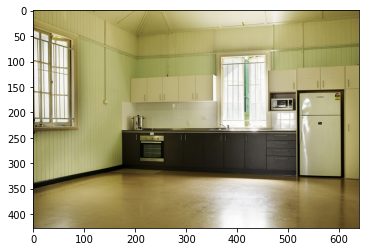

Greedy: the is of through cabinets the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000072873.jpg
[[-0.8715144991874695], [0.14414764940738678], [0.15708529949188232], [0.014388587325811386], [0.6733667254447937], [-0.8604306578636169], [0.3328360319137573], [-0.022770071402192116], [0.4660039246082306], [0.26120316982269287], [0.07566246390342712], [-0.29819875955581665], [-0.10805690288543701], [-0.576227605342865], [0.1830294281244278], [-0.6347813010215759], [-0.5299680233001709], [0.6014477014541626], [-0.27882590889930725], [-0.4931727647781372], [0.3431403934955597], [0.10011087357997894], [0.03279861807823181], [0.12242424488067627], [-0.18634875118732452], [0.1742480844259262], [0.09510348737239838], [-0.7385587096214294], [0.34803444147109985], [0.07539288699626923], [0.1349576860666275], [-0.605812668800354], [0.12101180851459503], [-0.19297677278518677], [1.1236737966537476], [0.508482813835144], [0.559941291809082], [-0.15937218070030212], [-0.6043044924736023], [0

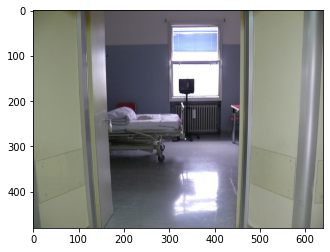

Greedy: the cat of living room the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000084410.jpg
[[0.09137328714132309], [0.1325734406709671], [-0.2339830845594406], [-0.2072603851556778], [0.9762263894081116], [-0.17536337673664093], [-0.43238797783851624], [0.06395556032657623], [-0.04905334860086441], [-0.45939233899116516], [0.2847766876220703], [-0.5292266011238098], [0.6981589794158936], [-0.541679322719574], [-0.06053110584616661], [-0.2640489935874939], [-0.5421749949455261], [0.40468043088912964], [0.9767118692398071], [-0.6780562996864319], [-0.234994575381279], [-0.5016065239906311], [0.4027126729488373], [0.08955493569374084], [-0.247322678565979], [0.12960590422153473], [-0.47434279322624207], [-0.7898849248886108], [-0.06747288256883621], [0.2015455812215805], [0.2639174163341522], [-0.4628073573112488], [-0.16745445132255554], [-0.2703953683376312], [-0.7662613987922668], [0.07918474078178406], [0.7433247566223145], [-0.7727699279785156], [-0.14789979159832], [0.298

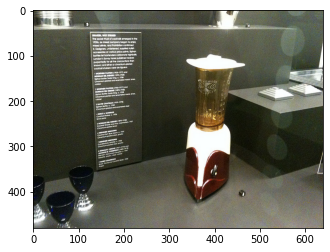

Greedy: white glass of of food food food
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000051437.jpg
[[-0.21380218863487244], [-0.015145895071327686], [0.3225208520889282], [0.21618980169296265], [0.8099492192268372], [-0.36178648471832275], [0.0054957750253379345], [0.061238862574100494], [0.17027945816516876], [0.17688176035881042], [0.4428461492061615], [-0.22615168988704681], [0.019993748515844345], [0.2619464695453644], [0.07369832694530487], [-0.5080239176750183], [-0.21549415588378906], [0.13934920728206635], [0.3645409643650055], [-0.19954238831996918], [0.226516455411911], [0.02275722101330757], [0.021306319162249565], [-0.05933798477053642], [-0.39156875014305115], [0.11605348438024521], [0.3429250121116638], [-1.0024302005767822], [0.2851504683494568], [-0.30674082040786743], [0.06079396605491638], [-0.5304592847824097], [-0.46908488869667053], [-0.2901582717895508], [0.07925768941640854], [0.3940121531486511], [0.031497497111558914], [-0.3191917836666107], [-0.026796

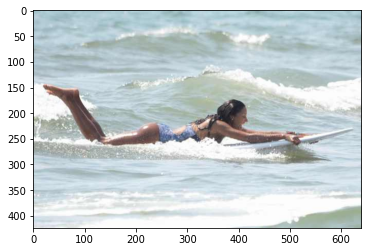

Greedy: dead man on on on on
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000118260.jpg
[[-0.008294245228171349], [0.49081316590309143], [-0.2302553802728653], [0.048410773277282715], [0.4740276634693146], [-0.22524161636829376], [0.02752677910029888], [-0.34155693650245667], [0.02165110781788826], [-0.15095829963684082], [0.19312414526939392], [0.31134068965911865], [0.23067887127399445], [-0.011160180903971195], [1.0560628175735474], [-0.4844999611377716], [-0.6027066707611084], [0.37500450015068054], [0.10074127465486526], [0.2579554617404938], [0.2347739338874817], [0.8313440084457397], [0.09777233004570007], [0.36314845085144043], [-0.12627315521240234], [-0.2800077199935913], [0.2533893585205078], [-0.8564440011978149], [0.4553718864917755], [0.22083303332328796], [0.018195394426584244], [-1.253501534461975], [-0.1939714401960373], [-0.5744867324829102], [0.47172966599464417], [0.6888979077339172], [0.19215147197246552], [-0.6338192224502563], [0.24367260932922363], [1.05

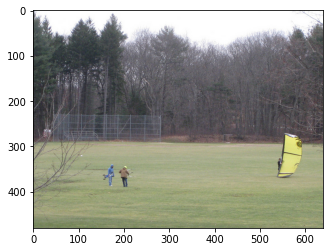

Greedy: the man landscape on on the the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000470256.jpg
[[0.05849658325314522], [0.10881919413805008], [0.1834336668252945], [-0.6497978568077087], [1.2099529504776], [-0.19450204074382782], [-0.024668773636221886], [-0.14407993853092194], [-0.22771672904491425], [0.09342312067747116], [0.5485596656799316], [-0.5763647556304932], [0.13922125101089478], [-0.5187112092971802], [0.29637837409973145], [-0.03509463369846344], [-0.6672332882881165], [0.29033997654914856], [-0.07695157825946808], [0.26535919308662415], [0.14178797602653503], [0.827103853225708], [0.40261444449424744], [0.18798747658729553], [0.15934441983699799], [0.6046386361122131], [-0.5176190733909607], [-0.7102792859077454], [-0.6446532011032104], [-0.36735060811042786], [0.054543253034353256], [-0.061526935547590256], [-0.3027839958667755], [-0.2745363712310791], [-0.25779977440834045], [1.010785698890686], [-0.7581900954246521], [-0.7576238512992859], [0.53109222650527

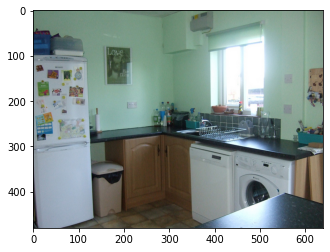

Greedy: an kitchen of line in the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000204036.jpg
[[-0.9210896492004395], [0.052638255059719086], [-0.0933757871389389], [-0.031519439071416855], [0.34651458263397217], [-0.265384703874588], [0.07743032276630402], [-0.11597363650798798], [0.08806643635034561], [0.6668234467506409], [-0.0011283321073278785], [-0.8891806602478027], [0.13145025074481964], [-0.010740471072494984], [-0.1797560304403305], [-0.46562981605529785], [-0.29034385085105896], [0.3802596926689148], [0.6936550140380859], [-0.39686644077301025], [0.2226533740758896], [0.1253378838300705], [0.07338343560695648], [0.2681237459182739], [0.07765471190214157], [-0.10425565391778946], [-0.0014862215612083673], [-0.6045106649398804], [-0.11116107553243637], [0.40691396594047546], [0.6915782690048218], [-0.17102046310901642], [-0.08946564793586731], [0.12944674491882324], [-0.4180072844028473], [0.42146044969558716], [0.24793751537799835], [-0.5962030291557312], [0.4446750879

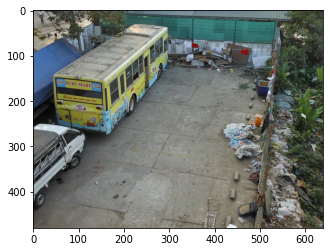

Greedy: the street of the on the the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000082052.jpg
[[-0.14873914420604706], [-0.32261091470718384], [-0.05653444677591324], [0.40349140763282776], [0.5734943151473999], [0.1179627776145935], [0.410902738571167], [-0.2838815152645111], [-0.5921967625617981], [0.5512863993644714], [0.17139384150505066], [0.19436676800251007], [-0.34846779704093933], [-0.1176702231168747], [0.05106854438781738], [-1.1626791954040527], [-0.13359755277633667], [0.1484794020652771], [0.16499964892864227], [-0.39913129806518555], [0.356534481048584], [0.1435982882976532], [0.5105199813842773], [0.2339285910129547], [-0.19818232953548431], [0.08824025839567184], [-0.00577897485345602], [-1.0063061714172363], [0.13576634228229523], [0.2483350932598114], [-0.014882044866681099], [-1.375771403312683], [0.014685561880469322], [-0.3472384810447693], [1.20108962059021], [0.9397499561309814], [-0.018940435722470284], [-0.05676551163196564], [0.2189224809408188], [-

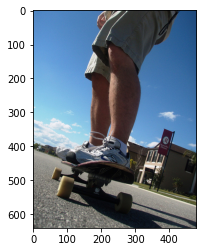

Greedy: the man of on on the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000083766.jpg
[[-0.45214033126831055], [-0.31939005851745605], [0.22475139796733856], [-0.24846577644348145], [0.7430384755134583], [-0.641787052154541], [0.4042002260684967], [0.8542603850364685], [-0.8170478940010071], [0.42033085227012634], [0.4702766239643097], [-0.5233428478240967], [-0.08350057899951935], [-0.16007913649082184], [0.13663199543952942], [-0.22465088963508606], [-0.5491514205932617], [0.44754648208618164], [0.8164793848991394], [-0.32473209500312805], [-0.02939048781991005], [-0.011749334633350372], [0.3173426389694214], [0.38189855217933655], [-0.0027959689032286406], [0.28018635511398315], [0.21065814793109894], [-0.8641785383224487], [0.31660622358322144], [-0.04925603047013283], [0.3762603998184204], [-0.8079379200935364], [-0.35442787408828735], [0.14394477009773254], [0.14084242284297943], [0.9001644849777222], [-0.046762045472860336], [-0.4495220184326172], [0.24327385425567627]

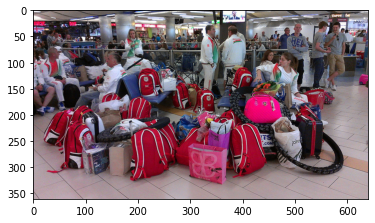

Greedy: the of of of of of the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000404988.jpg
[[-0.28947943449020386], [0.19192911684513092], [0.29119977355003357], [0.15353301167488098], [0.47327855229377747], [-0.11140795052051544], [-0.4521499276161194], [0.2979139983654022], [-0.2865195572376251], [0.054682061076164246], [0.801025390625], [-0.04535797983407974], [0.38385578989982605], [-0.22203201055526733], [-0.07776469737291336], [-0.47139906883239746], [-0.47941091656684875], [0.34827539324760437], [0.6319626569747925], [-0.6971004605293274], [0.247576043009758], [0.10516614466905594], [0.2737974524497986], [-0.4753323197364807], [0.10226432979106903], [-0.45534011721611023], [-0.22295443713665009], [-0.23254702985286713], [-0.06572633981704712], [-0.1686827391386032], [0.4836963713169098], [-0.3803659975528717], [-0.24501529335975647], [0.3677927255630493], [0.19881920516490936], [0.8137714862823486], [-0.05010300874710083], [-0.2679087221622467], [0.26457473635673523], [-0

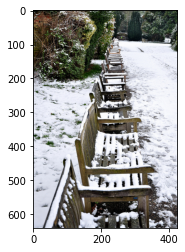

Greedy: the is of on the on
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000071281.jpg
[[0.20659500360488892], [0.5609264969825745], [-0.3555498421192169], [-0.25117021799087524], [-0.056022029370069504], [-0.34738555550575256], [0.5742507576942444], [0.6394676566123962], [-0.1648218333721161], [-0.257278710603714], [0.19053614139556885], [-0.10764492303133011], [0.42554521560668945], [-0.5350195169448853], [0.1801694631576538], [0.6132041811943054], [-0.8801417946815491], [0.48499858379364014], [0.009643865749239922], [0.08123774081468582], [-0.2489914447069168], [-0.042817845940589905], [0.23306025564670563], [-0.3359144628047943], [0.14506500959396362], [0.4885001480579376], [0.4257762134075165], [-0.29789456725120544], [-0.2570038139820099], [0.00994991697371006], [0.3255883455276489], [-0.38125258684158325], [-0.5267012715339661], [-0.2509068250656128], [-0.010834314860403538], [0.6127155423164368], [-0.0458911657333374], [-1.0405656099319458], [0.12944789230823517], [-0.0

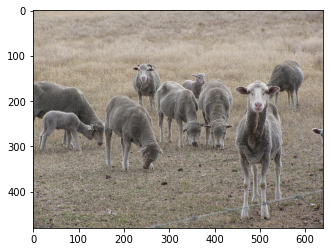

Greedy: two zebras stand in in the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000288002.jpg
[[-0.002696844981983304], [0.603561520576477], [-0.475981742143631], [0.14411978423595428], [1.0237305164337158], [-0.38503921031951904], [-0.12343091517686844], [0.3047172725200653], [-0.2940116822719574], [0.5193296074867249], [0.5114017128944397], [0.014667274430394173], [-0.2325456440448761], [0.13424809277057648], [0.10279694944620132], [-0.8457173109054565], [-0.26836827397346497], [0.030824946239590645], [0.08541958779096603], [0.0047172605991363525], [-0.11731915920972824], [0.05537291243672371], [0.7977762818336487], [-0.29843997955322266], [0.022863931953907013], [0.12870146334171295], [-0.17271409928798676], [-0.6976937055587769], [-0.08314672857522964], [-0.020928697660565376], [0.10879718512296677], [-0.3863199055194855], [0.10731139779090881], [-0.12031016498804092], [0.23383110761642456], [0.7175824642181396], [-0.3503602147102356], [-0.3767273724079132], [-0.44230976700

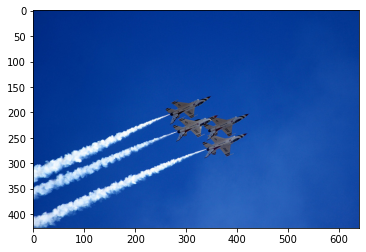

Greedy: an of of the the the the
/content/drive/MyDrive/CS685/val2014/COCO_val2014_000000535668.jpg
[[-0.46841102838516235], [0.7063302397727966], [-0.1618718057870865], [0.40548911690711975], [0.7736854553222656], [-0.039318304508924484], [-0.20538395643234253], [-0.10144206136465073], [0.23733824491500854], [0.35856133699417114], [0.266350656747818], [-0.3580140173435211], [-0.024960096925497055], [0.06557862460613251], [0.1550234705209732], [-0.3014173209667206], [-0.12295133620500565], [0.4347999095916748], [0.6659389734268188], [-0.024462103843688965], [0.8448191285133362], [0.1535596251487732], [0.32478073239326477], [0.3574678301811218], [-0.11930012702941895], [-0.4403667449951172], [-0.15958794951438904], [-0.7703002691268921], [-0.06716138869524002], [-0.04596807435154915], [0.045494332909584045], [-0.7105166912078857], [0.27234533429145813], [-0.1613112837076187], [0.3022812306880951], [0.6604526042938232], [-0.19130481779575348], [-0.7288863658905029], [0.3495633006095886],

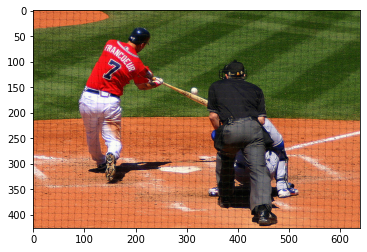

Greedy: dead man of to tennis tennis tennis tennis


In [ ]:
for z in range(1,20):
  pic = list(stf_test_0.keys())[z]
  print(pic)
  image = (stf_test_0[pic])#.reshape((1,2048))
  print(image.reshape(-1,1).tolist())
  # print(np.asarray(image).astype('float32'))
  image = image.detach().numpy().reshape(1,-1)#.tolist()
  print(image)
  x=plt.imread(pic)
  plt.imshow(x)
  plt.show()
  print("Greedy:",greedySearch(image))

# Model(Large) definition

In [ ]:
inputs10 = Input(shape=(27648,))
fe10 = Dropout(0.5)(inputs10)
fe20 = Dense(8192, activation='relu')(fe10)
fe30 = Dense(256, activation='relu')(fe20)
inputs20 = Input(shape=(max_length,))
se10 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs20)
se20 = Dropout(0.5)(se10)
se30 = LSTM(256)(se20)
decoder10 = add([fe30, se30])
decoder20 = Dense(256, activation='relu')(decoder10)
outputs0 = Dense(vocab_size, activation='softmax')(decoder20)
model0 = Model(inputs=[inputs10, inputs20], outputs=outputs0)

In [ ]:
model0.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 27648)]      0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 36)]         0                                            
__________________________________________________________________________________________________
dropout_2 (Dropout)             (None, 27648)        0           input_3[0][0]                    
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 36, 200)      196200      input_4[0][0]                    
_______________________________________________________________________________________

In [ ]:
model0.layers[3]

In [ ]:
model0.layers[3].set_weights([embedding_matrix])
model0.layers[3].trainable = False

In [ ]:
model0.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
epochs = 20
number_pics_per_batch = 3
steps = len(s_train_descriptions)//number_pics_per_batch

In [ ]:
# %mkdir /content/drive/MyDrive/ICDl/RNNLXMert-large/senticap/model_weights

In [ ]:
for i in range(epochs):
    generator = data_generator(s_train_descriptions, s_train_features, wordtoix, max_length, number_pics_per_batch)
    model0.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model0.save('/content/drive/MyDrive/ICDl/RNNLXMert-large/senticap/model_weights/model_' + str(i) + '.h5')